<a href="https://colab.research.google.com/github/Roon311/RNN-Models/blob/main/RNN_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![logo](https://drive.google.com/uc?export=view&id=1QJ9PAT9q-Ksv_Vs_pLXtLHxjjV-9FMTz)



_Prepared by_  [**Noureldin Mohamed Abdelsalam**](mailto:s-noureldin.hamedo@zewailcity.edu.eg)


#Installation and Imports

---



In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, GRU, Dense
from tensorflow.keras.losses import MeanAbsoluteError

import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import tensorflow as tf
import pandas_profiling as pp
from pandas_profiling import ProfileReport
from tensorflow import keras

from zipfile import ZipFile

In [ ]:
uri = "https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip"
zip_path = keras.utils.get_file(origin=uri, fname="jena_climate_2009_2016.csv.zip")
zip_file = ZipFile(zip_path)
zip_file.extractall()
csv_path = "jena_climate_2009_2016.csv"

# Dataset Analysis

## Creating the dataframe


---



In [ ]:
df = pd.read_csv(csv_path)
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


## Header explaination of the dataframe


---



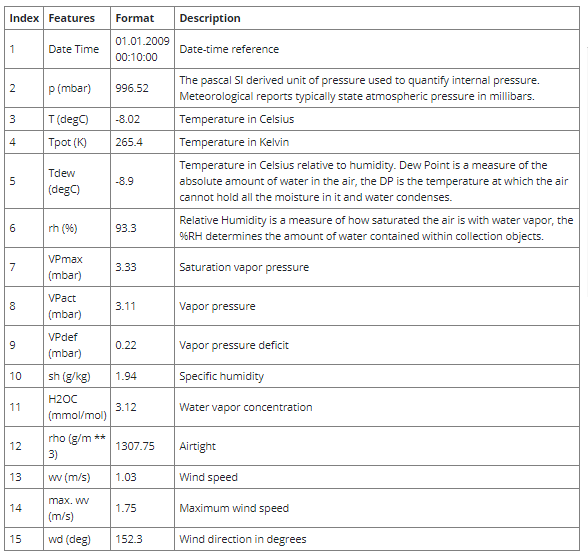

## Profiling


---



In [ ]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df.duplicated().sum()

327

In [ ]:
df.isnull().sum()

Date Time          0
p (mbar)           0
T (degC)           0
Tpot (K)           0
Tdew (degC)        0
rh (%)             0
VPmax (mbar)       0
VPact (mbar)       0
VPdef (mbar)       0
sh (g/kg)          0
H2OC (mmol/mol)    0
rho (g/m**3)       0
wv (m/s)           0
max. wv (m/s)      0
wd (deg)           0
dtype: int64

<ipython-input-111-fe6d98e4708c>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


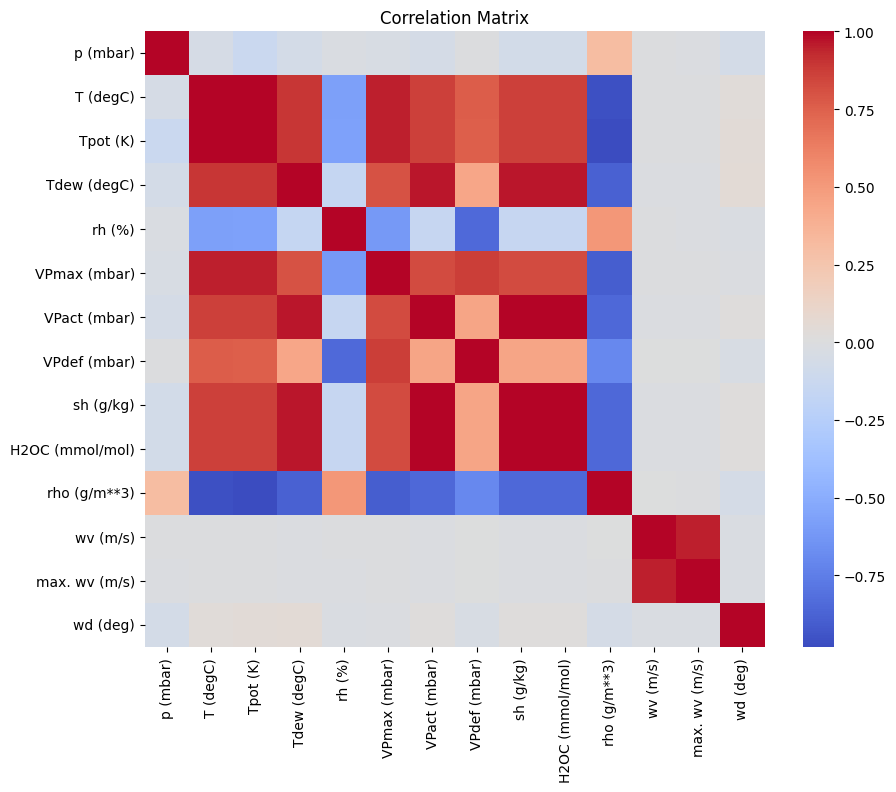

In [ ]:
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Data Cleaning


---




1.   Redundancy: Highly correlated features provide redundant information to the model. When two or more features are strongly correlated, they tend to carry similar information. Keeping both features can lead to overfitting, where the model learns to rely too heavily on those redundant features and may not generalize well to new data.

2. Model Interpretability: Having highly correlated features can make it difficult to interpret the impact of individual features on the model's predictions. If two features are highly correlated, it becomes challenging to distinguish the separate contributions of each feature to the target variable.


3. Computational Efficiency: Including highly correlated features in the model can increase computational complexity. These features may introduce multicollinearity, which can lead to numerical instability during model training and slow down the learning process.

4. Occam's Razor: In the context of machine learning, Occam's Razor suggests that simpler models are preferred over more complex ones if they achieve comparable performance. By removing highly correlated features, we reduce the complexity of the model and adhere to the principle of simplicity.

Lets drop the following features since they have high correlation: 


---

* Tpot (K)
* Tdew (degC) 
* rh
* VPact (mbar)
* max. wv (m/s)
* H2OC 

In [ ]:
df= df.drop(columns=['Tpot (K)','Tdew (degC)','rh (%)','VPact (mbar)','max. wv (m/s)', 'H2OC (mmol/mol)'])
df.head()

,Date Time,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,1.03,152.3
1,01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,0.72,136.1
2,01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,0.19,171.6
3,01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,0.34,198.0
4,01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,0.32,214.3


<ipython-input-113-fe6d98e4708c>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


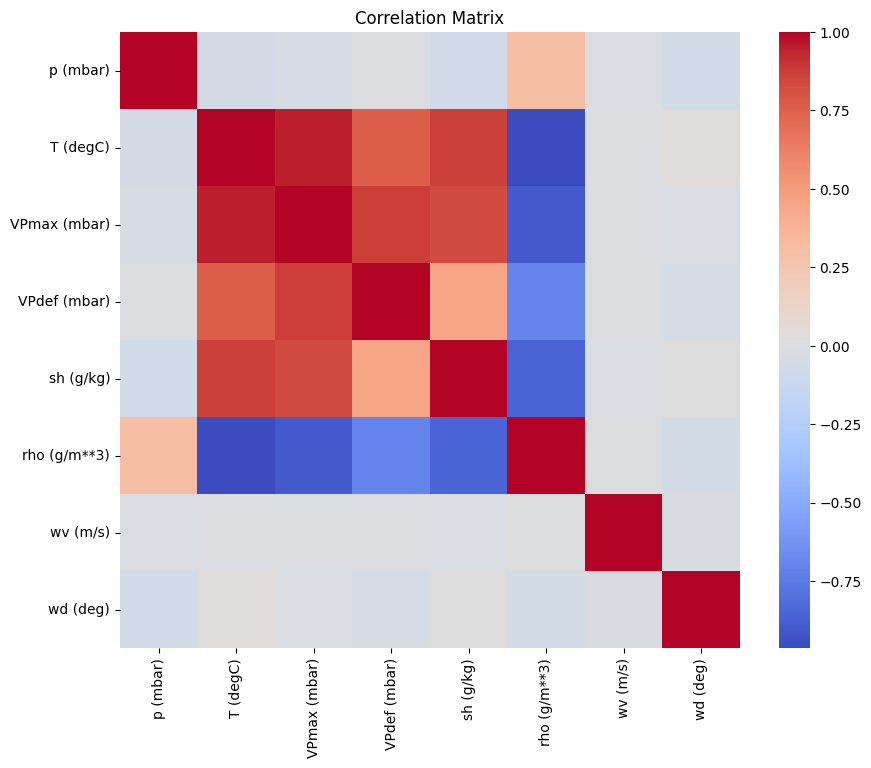

In [ ]:
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
rho (g/m**3),420551.0,1216.062748,39.975208,1059.45,1187.49,1213.79,1242.77,1393.54
wv (m/s),420551.0,1.702224,65.446714,-9999.00,0.99,1.76,2.86,28.49
wd (deg),420551.0,174.743738,86.681693,0.00,124.90,198.10,234.10,360.00


###Wind Velocity Min Value

One thing that should stand out is the min value of the wind velocity, wv (m/s) column. This -9999 is likely erroneous. There's a separate wind direction column, so the velocity should be >=0. Replace it with zeros:

In [ ]:
bad_wv = df['wv (m/s)'] == -9999.0
df['wv (m/s)'][bad_wv] = 0.0
df.describe().transpose()

<ipython-input-115-f52ecf5e8df0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['wv (m/s)'][bad_wv] = 0.0


,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
rho (g/m**3),420551.0,1216.062748,39.975208,1059.45,1187.49,1213.79,1242.77,1393.54
wv (m/s),420551.0,2.130191,1.542334,0.00,0.99,1.76,2.86,28.49
wd (deg),420551.0,174.743738,86.681693,0.00,124.90,198.10,234.10,360.00


### Wind direction

The last column of the data, wd (deg), gives the wind direction in units of degrees. Angles do not make good model inputs, 360° and 0° should be close to each other, and wrap around smoothly. It will be easier for the model to interpret if you convert the wind direction and velocity columns to a wind vector:
 

In [ ]:
wv = df.pop('wv (m/s)')

# Convert to radians.
wd_rad = df.pop('wd (deg)')*np.pi/180

# Calculate the wind x and y components.
df['Wx'] = wv*np.cos(wd_rad)
df['Wy'] = wv*np.sin(wd_rad)
df.head()

,Date Time,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),Wx,Wy
0,01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,-0.911955,0.478787
1,01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,-0.518797,0.499249
2,01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,-0.187962,0.027756
3,01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,-0.323359,-0.105066
4,01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,-0.264351,-0.180328


Change the indexing to the data and time rather than having date, and time as a feature.

In [ ]:
features= df.drop(columns='Date Time')
features.index=df['Date Time']
features.head()

,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),Wx,Wy
Date Time,,,,,,,,
01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,-0.911955,0.478787
01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,-0.518797,0.499249
01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,-0.187962,0.027756
01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,-0.323359,-0.105066
01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,-0.264351,-0.180328


### Split the data


---



* Label column name: ['T (degC)']
 
* Here we are picking ~300,000 data points for training. Observation is recorded every 10 mins, that means 6 times per hour. We will resample one point per hour since no drastic change is expected within 60 minutes. We do this via the sampling_rate argument in timeseries_dataset_from_array utility.

* We are tracking data from past 36 timestamps (36/6=6 hours). This data will be used to predict the temperature after 6 timestamps (6/6=1 hour).

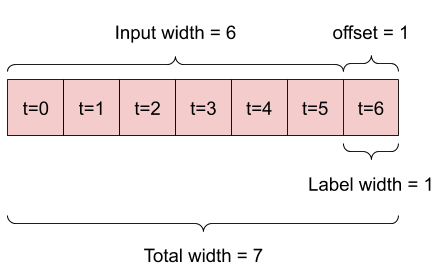

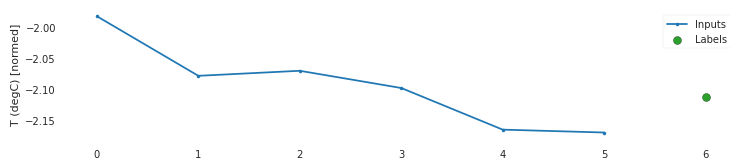

For example, to make a single prediction 24h into the future, given 24h of history you might define a window like this:

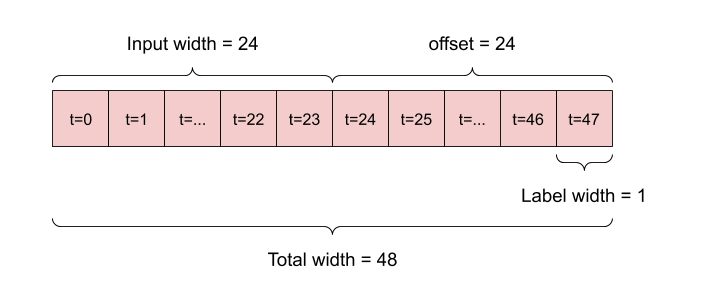

### Normalize the data

In [ ]:
def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    return (data - data_mean) / data_std

In [ ]:
def normalizetest(data, train_split):
    data_mean = data[train_split:].mean(axis=0)
    data_std = data[train_split:].std(axis=0)
    return (data - data_mean) / data_std

# Data Division 


---



## Train and Test Data

In [ ]:
split_fraction = 0.8
train_split = int(split_fraction * int(df.shape[0]))
print("Train split: ", train_split)
step = 6
past = 36
future = 6
learning_rate = 0.001
batch_size = 256
epochs = 10

featuresTest=normalizetest(features.values, train_split)
features = normalize(features.values, train_split)
features = pd.DataFrame(features)
featuresTest=pd.DataFrame(featuresTest)


Train split:  336440


In [ ]:
print('Train')
features.head()


Train


,0,1,2,3,4,5,6,7
0,0.920682,-2.014960,-1.315987,-0.782129,-1.493220,2.243871,-0.147652,0.571125
1,0.926670,-2.061164,-1.329360,-0.784270,-1.512196,2.294955,0.048198,0.584294
2,0.921879,-2.073012,-1.332035,-0.786410,-1.515992,2.305920,0.213002,0.280839
3,0.919484,-2.049317,-1.325348,-0.788551,-1.500811,2.279754,0.145555,0.195354
4,0.919484,-2.044578,-1.324011,-0.788551,-1.500811,2.275020,0.174949,0.146915


In [ ]:
print('Test')
featuresTest.head()

Test


,0,1,2,3,4,5,6,7
0,0.704003,-2.387108,-1.393903,-0.794576,-1.758300,2.541460,-0.126139,0.574368
1,0.710085,-2.435295,-1.405647,-0.796343,-1.777108,2.594485,0.080365,0.587628
2,0.705219,-2.447650,-1.407996,-0.798110,-1.780870,2.605866,0.254134,0.282071
3,0.702786,-2.422939,-1.402124,-0.799877,-1.765824,2.578707,0.183018,0.195995
4,0.702786,-2.417997,-1.400950,-0.799877,-1.765824,2.573792,0.214011,0.147220


## Validation

In [ ]:
split_fraction = 0.715
val_split = int(split_fraction * train_split)
train_data = features.loc[0 : val_split - 1]
test_data=  featuresTest.loc[0:]
val_data = features.loc[val_split:]

print('Train + Validation: ',train_split)
print("Train data shape: ", train_data.shape)
print("Validation data shape: ", val_data.shape)
print("Test data shape: ",test_data.shape)

Train + Validation:  336440
Train data shape:  (240554, 8)
Validation data shape:  (179997, 8)
Test data shape:  (420551, 8)


## Sequence Formation

In [ ]:
start = past + future
print("Start= ", start)
end = start + train_split
print("End= ", end)
x_train = train_data.values
print(x_train.shape)
y_train = features.iloc[start:end][[1]]

print(y_train.shape)
sequence_length = int(past / step)
print("Sequence length= ", sequence_length)

Start=  42
End=  336482
(240554, 8)
(336440, 1)
Sequence length=  6


In [ ]:
# Convert test_data to numpy array
x_test = test_data.values

# Calculate the start and end indices for test data
start_test = past + future
end_test = start_test + test_data.shape[0]

# Get the test labels (y_test)
y_test = featuresTest.iloc[start_test:end_test][[1]]

## Train Time Series Preprocessing

In [ ]:
dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

## Test Time Series Preprocessing

In [ ]:
# Create the test dataset
dataset_test = keras.preprocessing.timeseries_dataset_from_array(
    x_test,
    y_test,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

# Print the shapes of the test data and labels
print("Test data shape: ", x_test.shape)
print("Test labels shape: ", y_test.shape)

Test data shape:  (420551, 8)
Test labels shape:  (420509, 1)


## Validation Time Series Preprocessing

In [ ]:
x_end = len(val_data) - past - future

label_start = train_split + past + future

x_val = val_data.iloc[:x_end].values
y_val = features.iloc[label_start:][[1]]

dataset_val = keras.preprocessing.timeseries_dataset_from_array(
    x_val,
    y_val,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [ ]:
for batch in dataset_train.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)

Input shape: (256, 6, 8)
Target shape: (256, 1)


# Simple Vanilla RNN

---



![RNN](https://3863425935-files.gitbook.io/~/files/v0/b/gitbook-legacy-files/o/assets%2F-LIA3amopGH9NC6Rf0mA%2F-M4bJ-IWAKzglR0XHFwU%2F-M4bJ3KlTHWiVmpQRt6A%2Fcomputational-graph-2.png?generation=1586576266211098&alt=media)



## Creating the model


---



In [ ]:
from keras.layers import SimpleRNN

inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
rnn_out = SimpleRNN(32)(inputs)  # Replace LSTM with SimpleRNN
outputs = keras.layers.Dense(1)(rnn_out)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mae")  # Use mean absolute error (mae)
model.summary()

Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 6, 8)]            0         
                                                                 
 simple_rnn_4 (SimpleRNN)    (None, 32)                1312      
                                                                 
 dense_13 (Dense)            (None, 1)                 33        
                                                                 
Total params: 1,345
Trainable params: 1,345
Non-trainable params: 0
_________________________________________________________________


In [ ]:
path_checkpoint = "model_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/10
939/940 [============================>.] - ETA: 0s - loss: 0.1828
Epoch 1: val_loss improved from inf to 0.86030, saving model to model_checkpoint.h5
940/940 [==============================] - 38s 40ms/step - loss: 0.1828 - val_loss: 0.8603
Epoch 2/10
938/940 [============================>.] - ETA: 0s - loss: 0.1334
Epoch 2: val_loss did not improve from 0.86030
940/940 [==============================] - 37s 40ms/step - loss: 0.1335 - val_loss: 0.8689
Epoch 3/10
939/940 [============================>.] - ETA: 0s - loss: 0.1238
Epoch 3: val_loss did not improve from 0.86030
940/940 [==============================] - 37s 40ms/step - loss: 0.1239 - val_loss: 0.8762
Epoch 4/10
938/940 [============================>.] - ETA: 0s - loss: 0.1195
Epoch 4: val_loss did not improve from 0.86030
940/940 [==============================] - 38s 40ms/step - loss: 0.1196 - val_loss: 0.8791
Epoch 5/10
939/940 [============================>.] - ETA: 0s - loss: 0.1175
Epoch 5: val_loss did not 

8/8 [==============================] - 0s 2ms/step


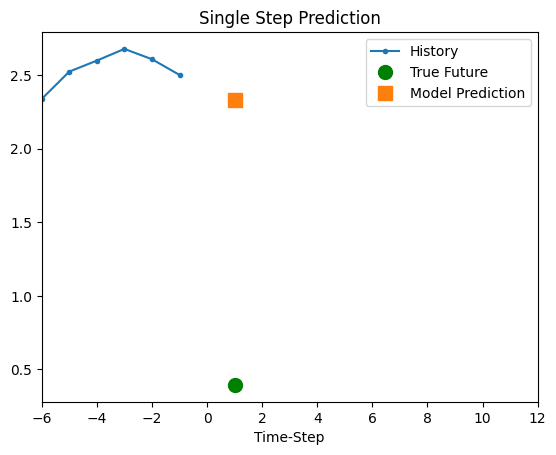

8/8 [==============================] - 0s 1ms/step


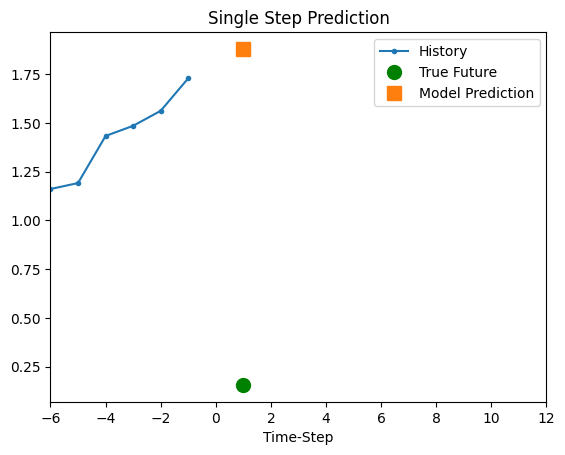

8/8 [==============================] - 0s 2ms/step


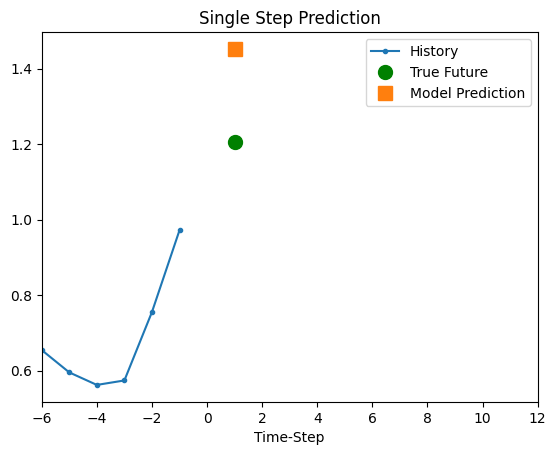

8/8 [==============================] - 0s 2ms/step


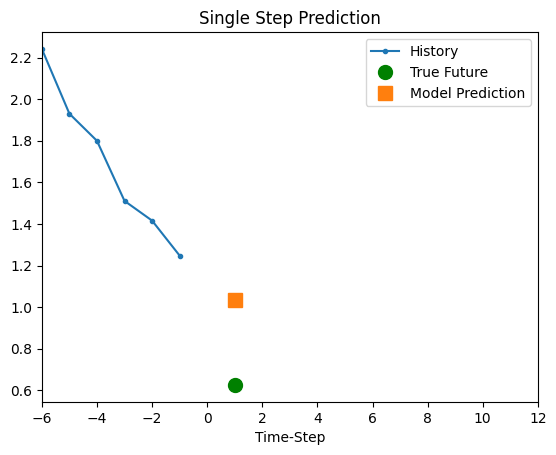

8/8 [==============================] - 0s 2ms/step


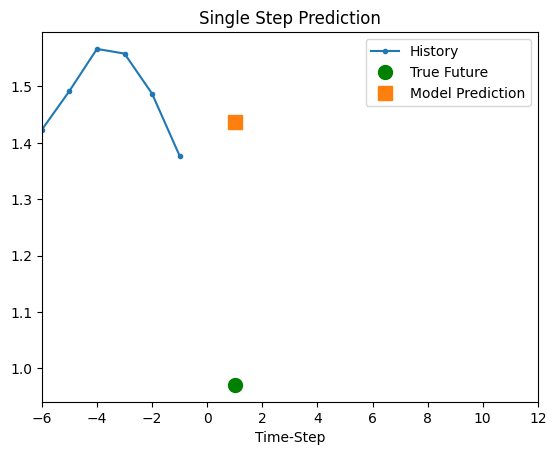

In [ ]:
%matplotlib inline
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "go", "s"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    
    plt.title(title)
    for i, val in enumerate(plot_data):
      if i:
        plt.plot(delta, plot_data[i], marker[i], markersize=10, label=labels[i])
      else:
        plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], (delta + 5) * 2])
    plt.xlabel("Time-Step")
    plt.show()
    return


for x, y in dataset_val.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

In [ ]:
# Evaluate the model on the test dataset
test_loss = model.evaluate(dataset_test)

# Print the test loss (generalization error)
print("Test Loss (Generalization Error):", test_loss)


1643/1643 [==============================] - 58s 35ms/step - loss: 0.1387
Test Loss (Generalization Error): 0.13865043222904205


1643/1643 [==============================] - 48s 29ms/step


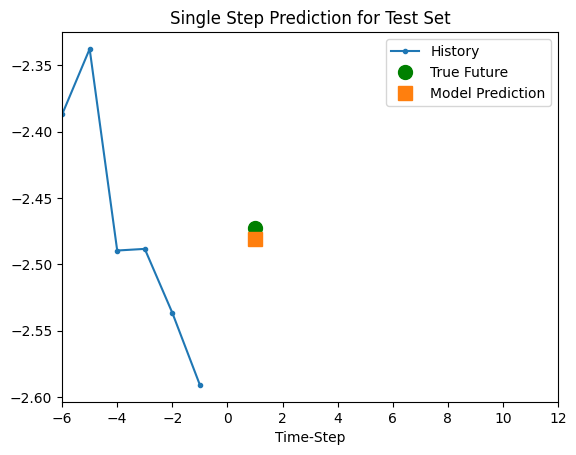

In [ ]:
# Generate predictions for the test set
predictions = model.predict(dataset_test)

# Plot the predicted values vs. the actual labels
for x, y in dataset_test.take(1):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), predictions[0]],
        1,
        "Single Step Prediction for Test Set"
    )

1643/1643 [==============================] - 53s 32ms/step


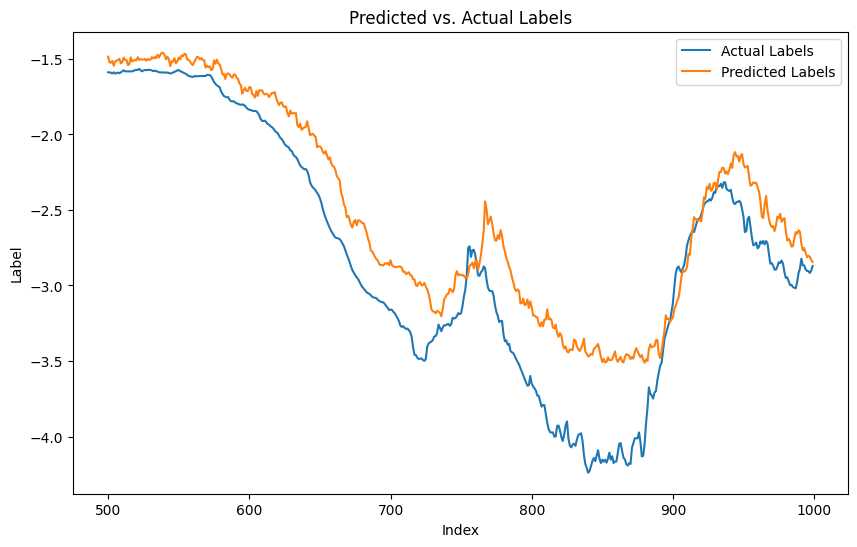

In [ ]:
import matplotlib.pyplot as plt

# Predict the labels for the test set
predicted_labels = model.predict(dataset_test)

# Get the actual labels for the test set
actual_labels = []
for x, y in dataset_test:
    actual_labels.extend(y.numpy())

# Plot the predicted labels vs. the actual labels for the range 500-1000
start_index = 500
end_index = 1000

plt.figure(figsize=(10, 6))
plt.plot(range(start_index, end_index), actual_labels[start_index:end_index], label='Actual Labels')
plt.plot(range(start_index, end_index), predicted_labels[start_index:end_index], label='Predicted Labels')
plt.xlabel('Index')
plt.ylabel('Label')
plt.title('Predicted vs. Actual Labels')
plt.legend()
plt.show()


# GRU

---



<img src="https://www.researchgate.net/publication/337294106/figure/fig1/AS:825835527348224@1573905941175/Diagram-of-the-gated-recurrent-unit-RNN-GRU-RNN-unit-Diagram-of-the-gated-recurrent.jpg" alt="GRU" width="600"/>


## Creating the model


---



In [ ]:
import keras
from keras.layers import GRU

inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
gru_out1 = GRU(32, return_sequences=True)(inputs)  # First GRU layer with return_sequences=True
gru_out2 = GRU(32)(gru_out1)  # Second GRU layer
outputs = keras.layers.Dense(1)(gru_out2)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mae")  # Use mean absolute error (mae)
model.summary()


Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 6, 8)]            0         
                                                                 
 gru_12 (GRU)                (None, 6, 32)             4032      
                                                                 
 gru_13 (GRU)                (None, 32)                6336      
                                                                 
 dense_12 (Dense)            (None, 1)                 33        
                                                                 
Total params: 10,401
Trainable params: 10,401
Non-trainable params: 0
_________________________________________________________________


In [ ]:
path_checkpoint = "model_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/10
938/940 [============================>.] - ETA: 0s - loss: 0.1936
Epoch 1: val_loss improved from inf to 0.86819, saving model to model_checkpoint.h5
940/940 [==============================] - 46s 46ms/step - loss: 0.1936 - val_loss: 0.8682
Epoch 2/10
938/940 [============================>.] - ETA: 0s - loss: 0.1296
Epoch 2: val_loss did not improve from 0.86819
940/940 [==============================] - 42s 45ms/step - loss: 0.1297 - val_loss: 0.8758
Epoch 3/10
939/940 [============================>.] - ETA: 0s - loss: 0.1213
Epoch 3: val_loss did not improve from 0.86819
940/940 [==============================] - 43s 46ms/step - loss: 0.1214 - val_loss: 0.8841
Epoch 4/10
938/940 [============================>.] - ETA: 0s - loss: 0.1187
Epoch 4: val_loss did not improve from 0.86819
940/940 [==============================] - 46s 49ms/step - loss: 0.1188 - val_loss: 0.8860
Epoch 5/10
938/940 [============================>.] - ETA: 0s - loss: 0.1166
Epoch 5: val_loss did not 

8/8 [==============================] - 1s 2ms/step


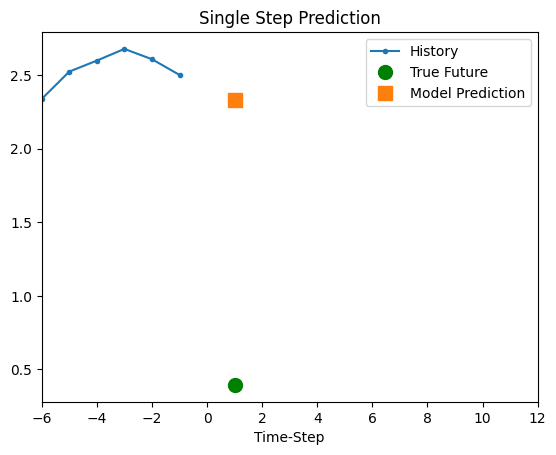

8/8 [==============================] - 0s 3ms/step


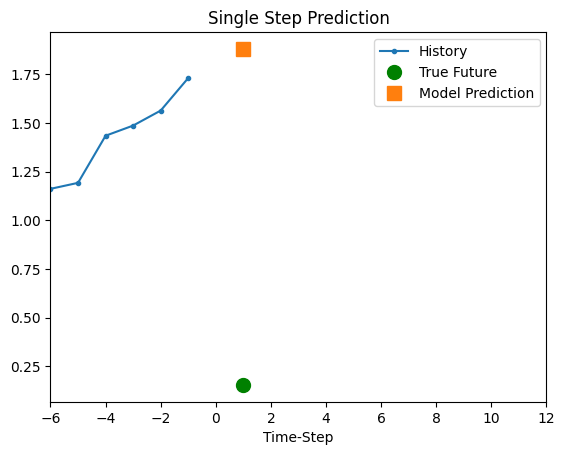

8/8 [==============================] - 0s 2ms/step


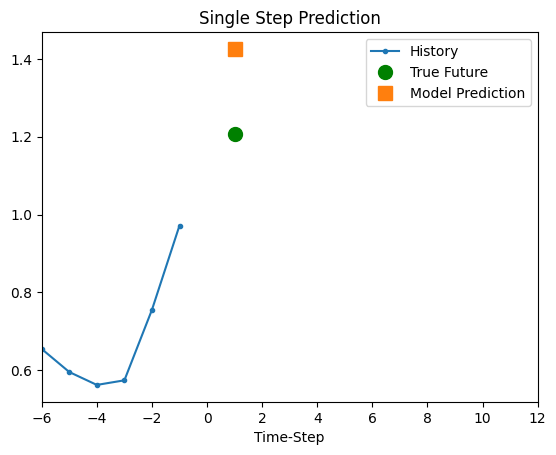

8/8 [==============================] - 0s 2ms/step


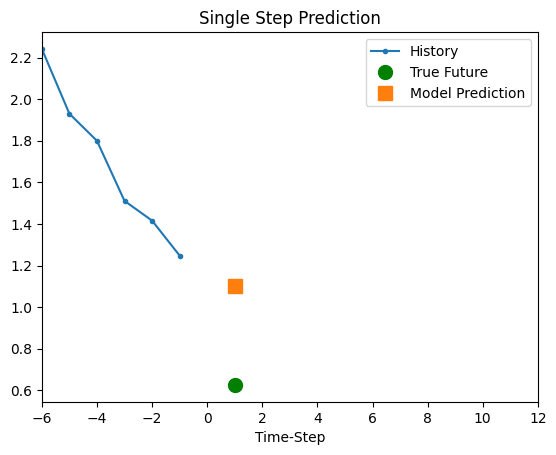

8/8 [==============================] - 0s 3ms/step


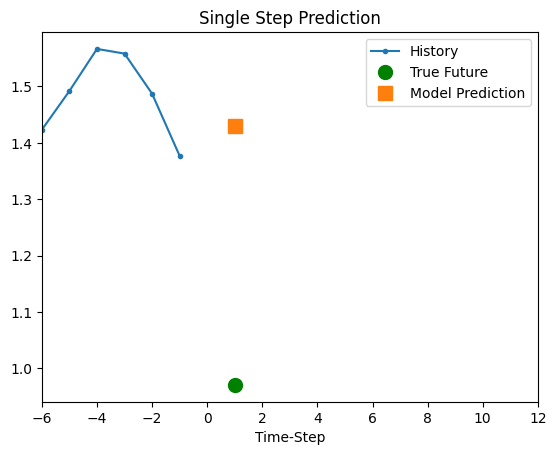

In [ ]:
%matplotlib inline
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "go", "s"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    
    plt.title(title)
    for i, val in enumerate(plot_data):
      if i:
        plt.plot(delta, plot_data[i], marker[i], markersize=10, label=labels[i])
      else:
        plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], (delta + 5) * 2])
    plt.xlabel("Time-Step")
    plt.show()
    return


for x, y in dataset_val.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

In [ ]:
# Evaluate the model on the test dataset
test_loss = model.evaluate(dataset_test)

# Print the test loss (generalization error)
print("Test Loss (Generalization Error):", test_loss)


1643/1643 [==============================] - 51s 31ms/step - loss: 0.1461
Test Loss (Generalization Error): 0.1461384892463684


1643/1643 [==============================] - 51s 31ms/step


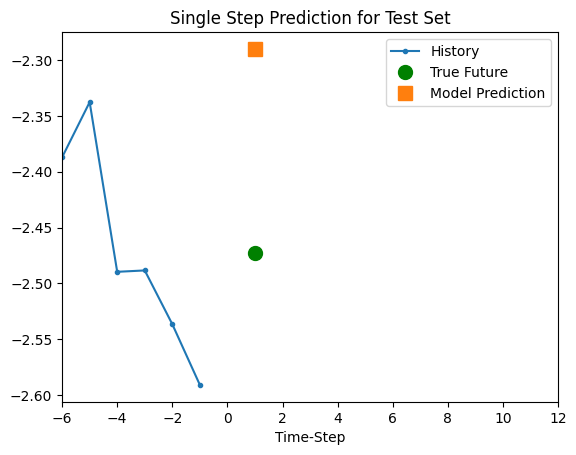

In [ ]:
# Generate predictions for the test set
predictions = model.predict(dataset_test)

# Plot the predicted values vs. the actual labels
for x, y in dataset_test.take(1):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), predictions[0]],
        1,
        "Single Step Prediction for Test Set"
    )

1643/1643 [==============================] - 52s 32ms/step


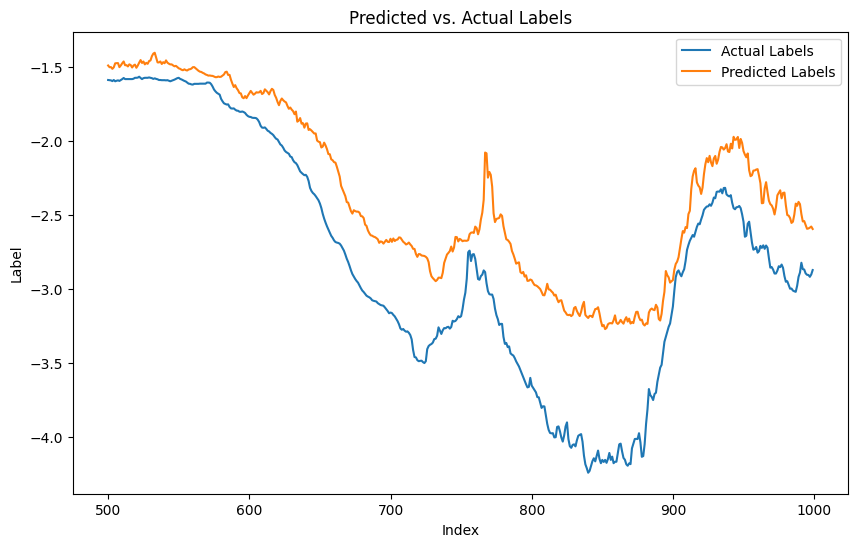

In [ ]:
import matplotlib.pyplot as plt

# Predict the labels for the test set
predicted_labels = model.predict(dataset_test)

# Get the actual labels for the test set
actual_labels = []
for x, y in dataset_test:
    actual_labels.extend(y.numpy())

# Plot the predicted labels vs. the actual labels for the range 500-1000
start_index = 500
end_index = 1000

plt.figure(figsize=(10, 6))
plt.plot(range(start_index, end_index), actual_labels[start_index:end_index], label='Actual Labels')
plt.plot(range(start_index, end_index), predicted_labels[start_index:end_index], label='Predicted Labels')
plt.xlabel('Index')
plt.ylabel('Label')
plt.title('Predicted vs. Actual Labels')
plt.legend()
plt.show()


# Comparison



1.   Test Loss (Generalization Error) for Simple Vanilla : 0.14323346316814423

2.   Test Loss (Generalization Error) for GRU: 0.1461384892463684


---



* Simple Vanilla performed better
* As we can see in the test graphs, simple Vanilla almost predicted the actual temprature
* GRU overfitting the data


